In [1]:
%load_ext autoreload
%autoreload 2

In [3]:
import numpy as np
import pandas as pd
import os

from hypopredict.cv import CV_splitter
from hypopredict import chunker
from hypopredict import labeler
from hypopredict.params import TRAIN_DAYS

In [4]:
days_train = TRAIN_DAYS

In [5]:
ECG_PATH = os.getenv('ECG_PATH')

In [6]:
print(f'Using ECG data from: {ECG_PATH}')

Using ECG data from: /home/abdati/code/sasha17demin/hypopredict/raw_data/data_ecg_FINAL/


In [7]:
days_train

[11,
 13,
 14,
 21,
 22,
 24,
 42,
 43,
 44,
 51,
 52,
 54,
 61,
 63,
 71,
 72,
 74,
 82,
 92,
 93]

In [8]:
splitter = CV_splitter(n_splits = 5,
                       ecg_dir = ECG_PATH,
                       glucose_src='local',
                       random_state = 21)
splits = splitter.get_splits(days_train)

In [9]:
splits

array([[43, 52, 93, 63],
       [24, 82, 92, 54],
       [42, 71, 13, 14],
       [61, 21, 44, 11],
       [74, 22, 72, 51]])

In [10]:
split_train = splits[:4]

In [11]:
split_train_chunkified = chunker.chunkify(split_train.ravel(),
                                     chunk_size=pd.Timedelta(minutes=30),
                                     step_size=pd.Timedelta(minutes=1),
                                     ecg_dir=ECG_PATH)


    Files concatinated:
                 ['/home/abdati/code/sasha17demin/hypopredict/raw_data/data_ecg_FINAL/EcgWaveform-52-09_23_58-0HG.feather', '/home/abdati/code/sasha17demin/hypopredict/raw_data/data_ecg_FINAL/EcgWaveform-52-11_40_30-0HG.feather']

    Files concatinated:
                 ['/home/abdati/code/sasha17demin/hypopredict/raw_data/data_ecg_FINAL/EcgWaveform-24-07_01_03-2HG.feather', '/home/abdati/code/sasha17demin/hypopredict/raw_data/data_ecg_FINAL/EcgWaveform-24-17_43_12-2HG.feather']

    Files concatinated:
                 ['/home/abdati/code/sasha17demin/hypopredict/raw_data/data_ecg_FINAL/EcgWaveform-61-15_08_04-0HG.feather', '/home/abdati/code/sasha17demin/hypopredict/raw_data/data_ecg_FINAL/EcgWaveform-61-06_46_44-0HG.feather']

    Files concatinated:
                 ['/home/abdati/code/sasha17demin/hypopredict/raw_data/data_ecg_FINAL/EcgWaveform-21-12_35_54-1HG.feather', '/home/abdati/code/sasha17demin/hypopredict/raw_data/data_ecg_FINAL/EcgWaveform-21-20_

In [12]:
split_train_chunkified

{43: [                         EcgWaveform
  datetime                            
  2014-10-03 08:05:42.448          297
  2014-10-03 08:05:42.452          297
  2014-10-03 08:05:42.456          297
  2014-10-03 08:05:42.460          297
  2014-10-03 08:05:42.464          297
  ...                              ...
  2014-10-03 08:35:42.428         2012
  2014-10-03 08:35:42.432         2012
  2014-10-03 08:35:42.436         2013
  2014-10-03 08:35:42.440         2014
  2014-10-03 08:35:42.444         2014
  
  [450000 rows x 1 columns],
                           EcgWaveform
  datetime                            
  2014-10-03 08:06:42.448         2402
  2014-10-03 08:06:42.452         2403
  2014-10-03 08:06:42.456         2404
  2014-10-03 08:06:42.460         2406
  2014-10-03 08:06:42.464         2407
  ...                              ...
  2014-10-03 08:36:42.428         1979
  2014-10-03 08:36:42.432         1979
  2014-10-03 08:36:42.436         1980
  2014-10-03 08:36:42.440   

In [16]:
split_train_labels = labeler.label_split(split_train_chunkified,
                                        glucose_src='gdrive',
                                        forecast_window=pd.Timedelta(minutes=30))

Labeling day 43 with 482 chunks
Labeling day 52 with 819 chunks
Labeling day 93 with 708 chunks
Labeling day 63 with 837 chunks
Labeling day 24 with 732 chunks
Labeling day 82 with 1033 chunks
Labeling day 92 with 865 chunks
Labeling day 54 with 441 chunks
Labeling day 42 with 739 chunks
Labeling day 71 with 904 chunks
Labeling day 13 with 764 chunks
Labeling day 14 with 434 chunks
Labeling day 61 with 1165 chunks
Labeling day 21 with 463 chunks
Labeling day 44 with 673 chunks
Labeling day 11 with 734 chunks


In [17]:
split_train_labels

{43: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1,

In [18]:
import hypopredict.chunk_preproc as cp

In [19]:
chunks_train, y_train = cp.filter_and_stack(
                            split_train_chunkified, split_train_labels
                        )

In [20]:
print('Number of chunks in training set:', len(chunks_train))
print('Number of labels in training set:', len(y_train))
print('The following chunk has label:', y_train[43])
chunks_train[43]

Number of chunks in training set: 8782
Number of labels in training set: 8782
The following chunk has label: 0


,EcgWaveform
datetime,
2014-10-03 08:48:42.448,1981
2014-10-03 08:48:42.452,1981
2014-10-03 08:48:42.456,1980
2014-10-03 08:48:42.460,1979
2014-10-03 08:48:42.464,1979
...,...
2014-10-03 09:18:42.428,1969
2014-10-03 09:18:42.432,1970
2014-10-03 09:18:42.436,1970


In [21]:
from hypopredict import feature_extraction

In [22]:
def extract_rolling_features(series, window_size, step_size, agg_funcs=['mean', 'std', 'min', 'max', 'median', 'skew', 'kurtosis']):
    """
    Extract rolling window features with custom step size.

    Args:
        series: pandas Series (ECG data)
        window_size: window length in samples
        step_size: step length in samples (e.g., 250 for 1 sec at 250 Hz)
        agg_funcs: list of aggregation functions

    Returns:
        DataFrame with features, one row per step
    """
    results = []
    indices = []

    # Slide window with step_size
    for start_idx in range(0, len(series) - window_size + 1, step_size):
        end_idx = start_idx + window_size
        window_data = series.iloc[start_idx:end_idx]

        # Compute all aggregations for this window
        agg_dict = {func: getattr(window_data['EcgWaveform'], func)() for func in agg_funcs}
        results.append(agg_dict)
        indices.append(start_idx)

    # Build DataFrame
    features = pd.DataFrame(results, index=indices)
    return features

# Example: 60-second window, 1-second step at 250 Hz
window_5min = 5 * 60 * 250  # 15000 samples
step_60sec = 60 * 250      # 250 samples

features = extract_rolling_features(
    chunks_train[43],
    window_size=window_5min,
    step_size=step_60sec,
    agg_funcs=['mean', 'std', 'min', 'max', 'median', 'skew', 'kurtosis']
)

features.head()

,mean,std,min,max,median,skew,kurtosis
0,1980.535867,143.524730,850,2771,1981.0,-2.483675,23.886901
15000,1977.777573,150.570488,850,2780,1981.0,-2.313639,23.216895
30000,1980.505627,173.879531,850,2780,1982.0,-1.665785,15.963289
45000,1976.922040,184.684031,771,2894,1982.0,-1.667963,14.620776
60000,1980.533493,198.960771,771,3187,1982.0,-1.106486,10.266437


In [23]:
features.shape

(26, 7)

In [25]:
# run extract_rolling_features on all chunks in chunks_train and concatenate results
all_features = []
i = 0
for chunk in chunks_train:
    if i % 500 == 0:
        print(f'Processing chunk {i}/{len(chunks_train)}')
    i += 1
    feat = extract_rolling_features(
        chunk,
        window_size=window_5min,
        step_size=step_60sec,
        agg_funcs=['mean', 'std', 'min', 'max', 'median', 'skew', 'kurtosis']
    )
    all_features.append(feat)
final_features = pd.concat(all_features, ignore_index=True)


Processing chunk 0/8782
Processing chunk 500/8782
Processing chunk 1000/8782
Processing chunk 1500/8782
Processing chunk 2000/8782
Processing chunk 2500/8782
Processing chunk 3000/8782
Processing chunk 3500/8782
Processing chunk 4000/8782
Processing chunk 4500/8782
Processing chunk 5000/8782
Processing chunk 5500/8782
Processing chunk 6000/8782
Processing chunk 6500/8782
Processing chunk 7000/8782
Processing chunk 7500/8782
Processing chunk 8000/8782
Processing chunk 8500/8782


In [26]:
final_features.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 223327 entries, 0 to 223326
Data columns (total 7 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   mean      223327 non-null  float64
 1   std       223327 non-null  float64
 2   min       223327 non-null  uint16 
 3   max       223327 non-null  uint16 
 4   median    223327 non-null  float64
 5   skew      223327 non-null  float64
 6   kurtosis  223327 non-null  float64
dtypes: float64(5), uint16(2)
memory usage: 9.4 MB


In [30]:
X_train = final_features

In [31]:
y_train_expanded = []
for label, chunk in zip(y_train, chunks_train):
    n_steps = (len(chunk) - window_5min) // step_60sec + 1
    y_train_expanded.extend([label] * n_steps)

In [32]:
len(y_train_expanded)

223327

In [36]:
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, confusion_matrix

#svm = SVC(kernel ='poly', degree=3, C=100)
#svm.fit(X_train_features, y_train)

svm_clf = Pipeline([
    ("scaler", StandardScaler()),
    ("svm", SVC(kernel="rbf", C=1.0, gamma="scale", probability=True))
])
svm_clf.fit(X_train, y_train_expanded)

,steps,"[('scaler', ...), ('svm', ...)]"
,transform_input,None
,memory,None
,verbose,False
,copy,True
,with_mean,True
,with_std,True
,C,1.0
,kernel,'rbf'
,degree,3
,gamma,'scale'


PR-AUC: 0.6876


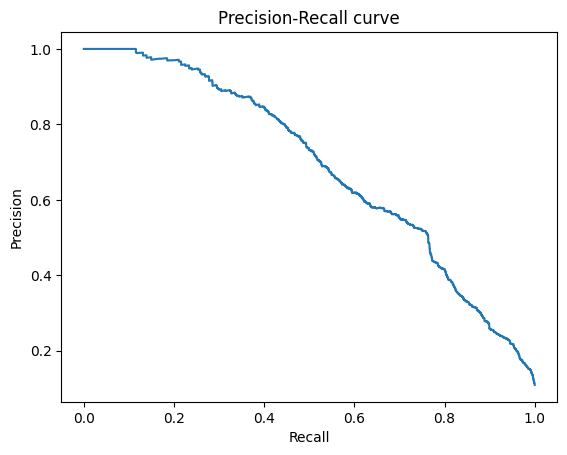

In [37]:
from matplotlib import pyplot as plt
from sklearn.metrics import precision_recall_curve, auc
y_train_pred_proba = svm_clf.predict_proba(X_train)[:, 1]
precision, recall, _ = precision_recall_curve(y_train_expanded, y_train_pred_proba)
pr_auc = auc(recall, precision)
print(f"PR-AUC: {pr_auc:.4f}")

# plot it
plt.plot(recall, precision)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall curve')
plt.show()


## Test Data

In [38]:
split_test = splits[4:5]

In [39]:
split_test


array([[74, 22, 72, 51]])

In [40]:
split_test_chunkified = chunker.chunkify(split_test.ravel(),
                                     chunk_size=pd.Timedelta(minutes=30),
                                     step_size=pd.Timedelta(minutes=1),
                                     ecg_dir=ECG_PATH)


    Files concatinated:
                 ['/home/abdati/code/sasha17demin/hypopredict/raw_data/data_ecg_FINAL/EcgWaveform-51-10_27_42-0HG.feather', '/home/abdati/code/sasha17demin/hypopredict/raw_data/data_ecg_FINAL/EcgWaveform-51-10_40_51-0HG.feather']


In [ ]:
split_test_chunkified

{43: [                         EcgWaveform
  datetime                            
  2014-10-03 08:05:42.448          297
  2014-10-03 08:05:42.452          297
  2014-10-03 08:05:42.456          297
  2014-10-03 08:05:42.460          297
  2014-10-03 08:05:42.464          297
  ...                              ...
  2014-10-03 08:35:42.428         2012
  2014-10-03 08:35:42.432         2012
  2014-10-03 08:35:42.436         2013
  2014-10-03 08:35:42.440         2014
  2014-10-03 08:35:42.444         2014
  
  [450000 rows x 1 columns],
                           EcgWaveform
  datetime                            
  2014-10-03 08:06:42.448         2402
  2014-10-03 08:06:42.452         2403
  2014-10-03 08:06:42.456         2404
  2014-10-03 08:06:42.460         2406
  2014-10-03 08:06:42.464         2407
  ...                              ...
  2014-10-03 08:36:42.428         1979
  2014-10-03 08:36:42.432         1979
  2014-10-03 08:36:42.436         1980
  2014-10-03 08:36:42.440   

In [41]:
split_test_labels = labeler.label_split(split_test_chunkified,
                                        glucose_src='gdrive',
                                        forecast_window=pd.Timedelta(minutes=30))

Labeling day 74 with 822 chunks
Labeling day 22 with 797 chunks
Labeling day 72 with 653 chunks
Labeling day 51 with 709 chunks


In [42]:
split_test_labels

{74: array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0,

In [44]:
chunks_test, y_test = cp.filter_and_stack(
                            split_test_chunkified, split_test_labels
                        )

In [46]:
print('Number of chunks in training set:', len(chunks_test))
print('Number of labels in training set:', len(y_test))
print('The following chunk has label:', y_test[74])
chunks_test[74]

Number of chunks in training set: 2981
Number of labels in training set: 2981
The following chunk has label: 0


,EcgWaveform
datetime,
2014-10-04 09:41:21.440,1948
2014-10-04 09:41:21.444,1947
2014-10-04 09:41:21.448,1947
2014-10-04 09:41:21.452,1948
2014-10-04 09:41:21.456,1949
...,...
2014-10-04 10:11:21.420,2044
2014-10-04 10:11:21.424,2046
2014-10-04 10:11:21.428,2047


In [47]:
class_balance = y_test.mean().round(4)*100
print(f'Class balance (hypoglycemia %) in training set: {class_balance}%')

Class balance (hypoglycemia %) in training set: 6.47%


In [48]:
# define window of 10 minutes in sample rate of 250 Hz
window_size =  60 * 250

In [49]:
window_size

15000

In [26]:
chunks_test[43].rolling(window=window_size).mean()

,EcgWaveform
datetime,
2014-10-03 08:48:42.448,NaN
2014-10-03 08:48:42.452,NaN
2014-10-03 08:48:42.456,NaN
2014-10-03 08:48:42.460,NaN
2014-10-03 08:48:42.464,NaN
...,...
2014-10-03 09:18:42.428,1977.357933
2014-10-03 09:18:42.432,1977.356733
2014-10-03 09:18:42.436,1977.355533


In [50]:
def extract_rolling_features(series, window_size, step_size, agg_funcs=['mean', 'std', 'min', 'max', 'median', 'skew', 'kurtosis']):
    """
    Extract rolling window features with custom step size.

    Args:
        series: pandas Series (ECG data)
        window_size: window length in samples
        step_size: step length in samples (e.g., 250 for 1 sec at 250 Hz)
        agg_funcs: list of aggregation functions

    Returns:
        DataFrame with features, one row per step
    """
    results = []
    indices = []

    # Slide window with step_size
    for start_idx in range(0, len(series) - window_size + 1, step_size):
        end_idx = start_idx + window_size
        window_data = series.iloc[start_idx:end_idx]

        # Compute all aggregations for this window
        agg_dict = {func: getattr(window_data['EcgWaveform'], func)() for func in agg_funcs}
        results.append(agg_dict)
        indices.append(start_idx)

    # Build DataFrame
    features = pd.DataFrame(results, index=indices)
    return features

# Example: 60-second window, 1-second step at 250 Hz
window_5min = 5 * 60 * 250  # 15000 samples
step_60sec = 60 * 250      # 250 samples

features = extract_rolling_features(
    chunks_test[43],
    window_size=window_5min,
    step_size=step_60sec,
    agg_funcs=['mean', 'std', 'min', 'max', 'median', 'skew', 'kurtosis']
)

features.head()

,mean,std,min,max,median,skew,kurtosis
0,1975.670707,48.096159,1735,2190,1962.0,0.751791,3.008660
15000,1975.653427,48.840822,1709,2253,1962.0,0.695674,3.007240
30000,1975.409453,48.487466,1709,2253,1963.0,0.697932,3.016302
45000,1975.479200,48.098013,1709,2253,1963.0,0.711384,3.102769
60000,1975.369747,48.046108,1709,2253,1963.0,0.714278,3.103169


In [51]:
# run extract_rolling_features on all chunks in chunks_train and concatenate results
all_features = []
i = 0
for chunk in chunks_test:
    if i % 500 == 0:
        print(f'Processing chunk {i}/{len(chunks_test)}')
    i += 1
    feat = extract_rolling_features(
        chunk,
        window_size=window_5min,
        step_size=step_60sec,
        agg_funcs=['mean', 'std', 'min', 'max', 'median', 'skew', 'kurtosis']
    )
    all_features.append(feat)
X_test = pd.concat(all_features, ignore_index=True)

Processing chunk 0/2981
Processing chunk 500/2981
Processing chunk 1000/2981
Processing chunk 1500/2981
Processing chunk 2000/2981
Processing chunk 2500/2981


In [54]:
y_test_expanded = []
for label, chunk in zip(y_test, chunks_test):
    n_steps = (len(chunk) - window_5min) // step_60sec + 1
    y_test_expanded.extend([label] * n_steps)

In [52]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75686 entries, 0 to 75685
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   mean      75686 non-null  float64
 1   std       75686 non-null  float64
 2   min       75686 non-null  uint16 
 3   max       75686 non-null  uint16 
 4   median    75686 non-null  float64
 5   skew      75686 non-null  float64
 6   kurtosis  75686 non-null  float64
dtypes: float64(5), uint16(2)
memory usage: 3.2 MB


In [55]:
len(y_test_expanded)

75686

PR-AUC: 0.1044


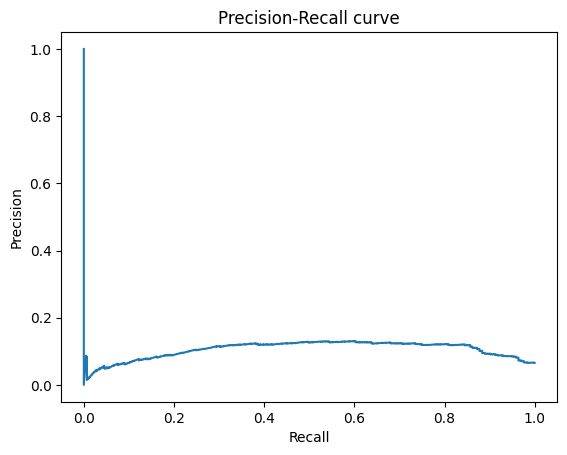

In [56]:
from matplotlib import pyplot as plt
from sklearn.metrics import precision_recall_curve, auc
y_test_pred_proba = svm_clf.predict_proba(X_test)[:, 1]
precision, recall, _ = precision_recall_curve(y_test_expanded, y_test_pred_proba)
pr_auc = auc(recall, precision)
print(f"PR-AUC: {pr_auc:.4f}")

# plot it
plt.plot(recall, precision)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall curve')
plt.show()

In [57]:
# save svm_clf model into pickle file
import pickle
with open('../models/dati94/svm_clf_model_withNewChunk.pkl', 'wb') as f:
    pickle.dump(svm_clf, f)